
## Overview

This analysis and predictive Random Forest Regression model focuses on Unemployment rate in USA over 2000-2022.

Data Source:https://www.ers.usda.gov/data-products/county-level-data-sets/

Import Data into a Dataframe table

In [0]:
# File location and type
file_location = "/FileStore/tables/UnemploymentUSA2.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
#delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
unemployment_df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .load(file_location)

display(unemployment_df)

FIPS_Code,State,Area_Name,Rural_Urban_Continuum_Code_2013,Urban_Influence_Code_2013,Metro_2013,Civilian_labor_force_2000,Employed_2000,Unemployed_2000,Unemployment_rate_2000,Civilian_labor_force_2001,Employed_2001,Unemployed_2001,Unemployment_rate_2001,Civilian_labor_force_2002,Employed_2002,Unemployed_2002,Unemployment_rate_2002,Civilian_labor_force_2003,Employed_2003,Unemployed_2003,Unemployment_rate_2003,Civilian_labor_force_2004,Employed_2004,Unemployed_2004,Unemployment_rate_2004,Civilian_labor_force_2005,Employed_2005,Unemployed_2005,Unemployment_rate_2005,Civilian_labor_force_2006,Employed_2006,Unemployed_2006,Unemployment_rate_2006,Civilian_labor_force_2007,Employed_2007,Unemployed_2007,Unemployment_rate_2007,Civilian_labor_force_2008,Employed_2008,Unemployed_2008,Unemployment_rate_2008,Civilian_labor_force_2009,Employed_2009,Unemployed_2009,Unemployment_rate_2009,Civilian_labor_force_2010,Employed_2010,Unemployed_2010,Unemployment_rate_2010,Civilian_labor_force_2011,Employed_2011,Unemployed_2011,Unemployment_rate_2011,Civilian_labor_force_2012,Employed_2012,Unemployed_2012,Unemployment_rate_2012,Civilian_labor_force_2013,Employed_2013,Unemployed_2013,Unemployment_rate_2013,Civilian_labor_force_2014,Employed_2014,Unemployed_2014,Unemployment_rate_2014,Civilian_labor_force_2015,Employed_2015,Unemployed_2015,Unemployment_rate_2015,Civilian_labor_force_2016,Employed_2016,Unemployed_2016,Unemployment_rate_2016,Civilian_labor_force_2017,Employed_2017,Unemployed_2017,Unemployment_rate_2017,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Civilian_labor_force_2019,Employed_2019,Unemployed_2019,Unemployment_rate_2019,Civilian_labor_force_2020,Employed_2020,Unemployed_2020,Unemployment_rate_2020,Civilian_labor_force_2021,Employed_2021,Unemployed_2021,Unemployment_rate_2021,Civilian_labor_force_2022,Employed_2022,Unemployed_2022,Unemployment_rate_2022,Median_Household_Income_2021,Med_HH_Income_Percent_of_State_Total_2021
0,US,United States,null,null,null,142601576.00,136904853.00,5696723.00,4.00,143786537.00,136977996.00,6808541.00,4.70,144839298.00,136455783.00,8383515.00,5.80,145660094.00,136944522.00,8715572.00,6.00,146724795.00,138613904.00,8110891.00,5.50,148597241.00,141000912.00,7596329.00,5.10,150707773.00,143729350.00,6978423.00,4.60,152191050.00,145156133.00,7034917.00,4.60,153761037.00,144860349.00,8900688.00,5.80,153825454.00,139594699.00,14230755.00,9.30,154254521.00,139393814.00,14860707.00,9.60,154520678.00,140688861.00,13831817.00,9.00,155038121.00,142527201.00,12510920.00,8.10,155362278.00,143905037.00,11457241.00,7.40,155936159.00,146318952.00,9617207.00,6.20,156840649.00,148554918.00,8285731.00,5.30,158674951.00,150949349.00,7725602.00,4.90,160744592.00,153744181.00,7000411.00,4.40,162039448.00,155727509.00,6311939.00,3.90,163815888.00,157805898.00,6009990.00,3.70,161483724.00,148453335.00,13030389.00,8.10,162229903.00,153544980.00,8684923.00,5.40,164781642.00,158766998.00,6014644.00,3.70,69717.00,null
1000,AL,Alabama,null,null,null,2147173.00,2047731.00,99442.00,4.60,2128027.00,2017467.00,110560.00,5.20,2112621.00,1987633.00,124988.00,5.90,2128668.00,2001568.00,127100.00,6.00,2138306.00,2018783.00,119523.00,5.60,2140356.00,2045234.00,95122.00,4.40,2170007.00,2083207.00,86800.00,4.00,2180448.00,2092030.00,88418.00,4.10,2176854.00,2049579.00,127275.00,5.80,2156593.00,1938784.00,217809.00,10.10,2197028.00,1968824.00,228204.00,10.40,2202337.00,1991379.00,210958.00,9.60,2178508.00,2000848.00,177660.00,8.20,2172102.00,2012828.00,159274.00,7.30,2164715.00,2018705.00,146010.00,6.70,2152295.00,2020443.00,131852.00,6.10,2155729.00,2029157.00,126572.00,5.90,2203458.00,2103873.00,99585.00,4.50,2240109.00,2152270.00,87839.00,3.90,2272935.00,2200437.00,72498.00,3.20,2269672.00,2124409.00,145263.00,6.40,2259349.00,2183330.00,76019.00,3.40,2286028.00,2226670.00,59358.00,2.60,53990.00,100.00
1001,AL,"Autauga County, AL",2,2,1,21861.00,20971.00,890.00,4.10,22081.00,21166.00,915.00,4.10,22161.00,21

Import Python Libraries

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Prepare and Transform Data

In [0]:
#Convert spark dataframe to pandas dataframe
unemployment_pdf = unemployment_df.select("*").toPandas()

In [0]:
unemployment_pdf.head()

,FIPS_Code,State,Area_Name,Rural_Urban_Continuum_Code_2013,Urban_Influence_Code_2013,Metro_2013,Civilian_labor_force_2000,Employed_2000,Unemployed_2000,Unemployment_rate_2000,...,Civilian_labor_force_2021,Employed_2021,Unemployed_2021,Unemployment_rate_2021,Civilian_labor_force_2022,Employed_2022,Unemployed_2022,Unemployment_rate_2022,Median_Household_Income_2021,Med_HH_Income_Percent_of_State_Total_2021
0,0,US,United States,None,None,None,142601576.00,136904853.00,5696723.00,4.00,...,162229903.00,153544980.00,8684923.00,5.40,164781642.00,158766998.00,6014644.00,3.70,69717.00,None
1,1000,AL,Alabama,None,None,None,2147173.00,2047731.00,99442.00,4.60,...,2259349.00,2183330.00,76019.00,3.40,2286028.00,2226670.00,59358.00,2.60,53990.00,100.00
2,1001,AL,"Autauga County, AL",2,2,1,21861.00,20971.00,890.00,4.10,...,26545.00,25809.00,736.00,2.80,26789.00,26181.00,608.00,2.30,66444.00,123.10
3,1003,AL,"Baldwin County, AL",3,2,1,69979.00,67370.00,2609.00,3.70,...,99953.00,97034.00,2919.00,2.90,102849.00,100432.00,2417.00,2.40,65658.00,121.60
4,1005,AL,"Barbour County, AL",6,6,0,11449.00,10812.00,637.00,5.60,...,8280.00,7821.00,459.00,5.50,8241.00,7906.00,335.00,4.10,38649.00,71.60


In [0]:
unemployment_pdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3277 entries, 0 to 3276
Data columns (total 100 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   FIPS_Code                                  3277 non-null   object
 1   State                                      3277 non-null   object
 2   Area_Name                                  3277 non-null   object
 3   Rural_Urban_Continuum_Code_2013            3219 non-null   object
 4   Urban_Influence_Code_2013                  3219 non-null   object
 5   Metro_2013                                 3224 non-null   object
 6   Civilian_labor_force_2000                  3270 non-null   object
 7   Employed_2000                              3270 non-null   object
 8   Unemployed_2000                            3270 non-null   object
 9   Unemployment_rate_2000                     3270 non-null   object
 10  Civilian_labor_force_2001          

In [0]:
#Select relevant columns from the original unemployment dataset
unemployment_rate = unemployment_pdf[['FIPS_Code', 'State', 'Area_Name', 'Rural_Urban_Continuum_Code_2013', 'Urban_Influence_Code_2013', 'Metro_2013', 'Civilian_labor_force_2000', 'Median_Household_Income_2021','Med_HH_Income_Percent_of_State_Total_2021', 'Unemployment_rate_2000','Unemployment_rate_2001','Unemployment_rate_2002','Unemployment_rate_2003','Unemployment_rate_2004','Unemployment_rate_2005','Unemployment_rate_2006','Unemployment_rate_2007','Unemployment_rate_2008','Unemployment_rate_2009','Unemployment_rate_2010', 'Unemployment_rate_2011', 'Unemployment_rate_2012', 'Unemployment_rate_2013','Unemployment_rate_2014','Unemployment_rate_2015','Unemployment_rate_2016','Unemployment_rate_2017','Unemployment_rate_2018','Unemployment_rate_2019','Unemployment_rate_2020','Unemployment_rate_2021','Unemployment_rate_2022']]

In [0]:
unemployment_rate.columns=['FIPS_Code', 'State', 'Area_Name', 'Rural_Urban_Continuum_Code_2013', 'Urban_Influence_Code_2013', 'Metro_2013', 'Civilian_labor_force_2000', 
 'Median_Household_Income_2021','Med_HH_Income_Percent_of_State_Total_2021', '2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010', '2011', '2012', '2013','2014','2015','2016','2017','2018','2019','2020','2021','2022']

In [0]:
unemployment_rate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3277 entries, 0 to 3276
Data columns (total 32 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   FIPS_Code                                  3277 non-null   object
 1   State                                      3277 non-null   object
 2   Area_Name                                  3277 non-null   object
 3   Rural_Urban_Continuum_Code_2013            3219 non-null   object
 4   Urban_Influence_Code_2013                  3219 non-null   object
 5   Metro_2013                                 3224 non-null   object
 6   Civilian_labor_force_2000                  3270 non-null   object
 7   Median_Household_Income_2021               3194 non-null   object
 8   Med_HH_Income_Percent_of_State_Total_2021  3193 non-null   object
 9   2000                                       3270 non-null   object
 10  2001                                

In [0]:
#Transform/unpivot dataframe to convert years into a column and populate unemployment rate across the years
melted = unemployment_rate.melt(id_vars=['FIPS_Code', 'State', 'Area_Name', 'Rural_Urban_Continuum_Code_2013', 'Urban_Influence_Code_2013', 'Metro_2013', 'Civilian_labor_force_2000', 'Median_Household_Income_2021', 'Med_HH_Income_Percent_of_State_Total_2021'], var_name='year', value_name='Unemployment_rate')

In [0]:
melted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75371 entries, 0 to 75370
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   FIPS_Code                                  75371 non-null  object
 1   State                                      75371 non-null  object
 2   Area_Name                                  75371 non-null  object
 3   Rural_Urban_Continuum_Code_2013            74037 non-null  object
 4   Urban_Influence_Code_2013                  74037 non-null  object
 5   Metro_2013                                 74152 non-null  object
 6   Civilian_labor_force_2000                  75210 non-null  object
 7   Median_Household_Income_2021               73462 non-null  object
 8   Med_HH_Income_Percent_of_State_Total_2021  73439 non-null  object
 9   year                                       75371 non-null  object
 10  Unemployment_rate                 

Data Discovery and Visualization

- Yearly Trend in Unemployment Rate over time
- Yearly Trend in Unemployment Rate in Metro (Urban) and Non-Metro Communities

In [0]:
#Convert columns to integer data type 
melted['year']=melted['year'].astype(int)
melted['Unemployment_rate']=melted['Unemployment_rate'].astype(float)

In [0]:
melted['Median_Household_Income_2021']=melted['Median_Household_Income_2021'].astype(float)
melted['Med_HH_Income_Percent_of_State_Total_2021']=melted['Med_HH_Income_Percent_of_State_Total_2021'].astype(float)

In [0]:
melted['Median_Household_Income_2021']

Out[20]: 0        69717.0
1        53990.0
2        66444.0
3        65658.0
4        38649.0
          ...   
75366        NaN
75367        NaN
75368        NaN
75369        NaN
75370        NaN
Name: Median_Household_Income_2021, Length: 75371, dtype: float64

In [0]:
#Group Unemployment Rate by Year to get historical trends
unemployment_yearly=pd.DataFrame(melted.groupby('year')['Unemployment_rate'].mean())
unemployment_yearly

,Unemployment_rate
year,
2000,4.540581
2001,5.233119
2002,5.981193
2003,6.226391
2004,5.879235
2005,5.671713
2006,5.152253
2007,5.106116
2008,6.032722


In [0]:
unemployment_yearly.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23 entries, 2000 to 2022
Data columns (total 1 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unemployment_rate  23 non-null     float64
dtypes: float64(1)
memory usage: 368.0 bytes


In [0]:
unemployment_yearly.index

Out[23]: Int64Index([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
            2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
            2022],
           dtype='int64', name='year')

In [0]:
unemployment_yearly['year']=unemployment_yearly.index

In [0]:
unemployment_yearly

,Unemployment_rate,year
year,,
2000,4.540581,2000
2001,5.233119,2001
2002,5.981193,2002
2003,6.226391,2003
2004,5.879235,2004
2005,5.671713,2005
2006,5.152253,2006
2007,5.106116,2007
2008,6.032722,2008


Yearly Trend in Unemployment Rate over time

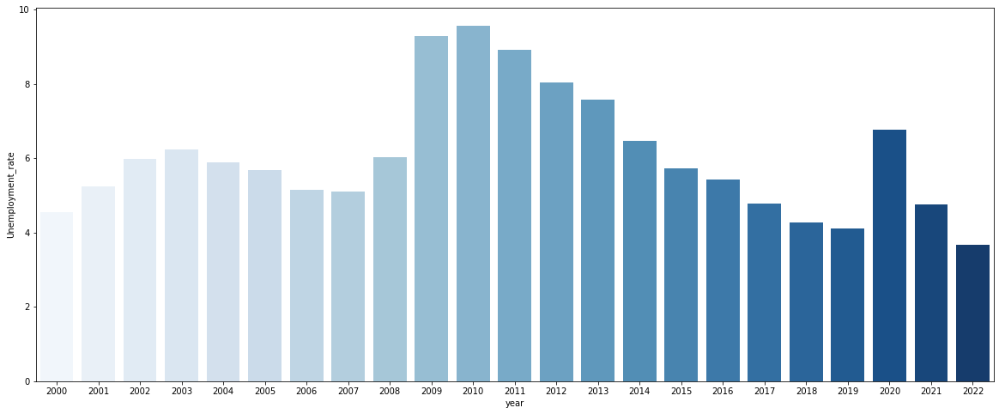

In [0]:
#Plot Mean Unemployment Rate in USA by Year
plt.figure(figsize=(20, 8))
sns.barplot(x='year', y='Unemployment_rate', data=unemployment_yearly, palette='Blues')
plt.show()

In [0]:
#Group Unemployment rate data by Metro designation for each community
unemployment_metro=pd.DataFrame(melted.groupby(['year', 'Metro_2013'], as_index=False)['Unemployment_rate'].mean())
unemployment_metro

,year,Metro_2013,Unemployment_rate
0,2000,0,4.695411
1,2000,1,4.314911
2,2001,0,5.342915
3,2001,1,5.081280
4,2002,0,5.987090
5,2002,1,5.991167
6,2003,0,6.267423
7,2003,1,6.180794
8,2004,0,5.947151
9,2004,1,5.792301


Yearly Trend in Unemployment Rate in Metro (Urban) and Non-Metro Communities

During periods of relatively high unemployment, Metro locations have higher unemployment than non-metro.

During periods of relatively lower unemployment, Metro and Non-Metro locations have more similar rates. 

Urban jobs in Metro areas are more affected by rising unemployment.

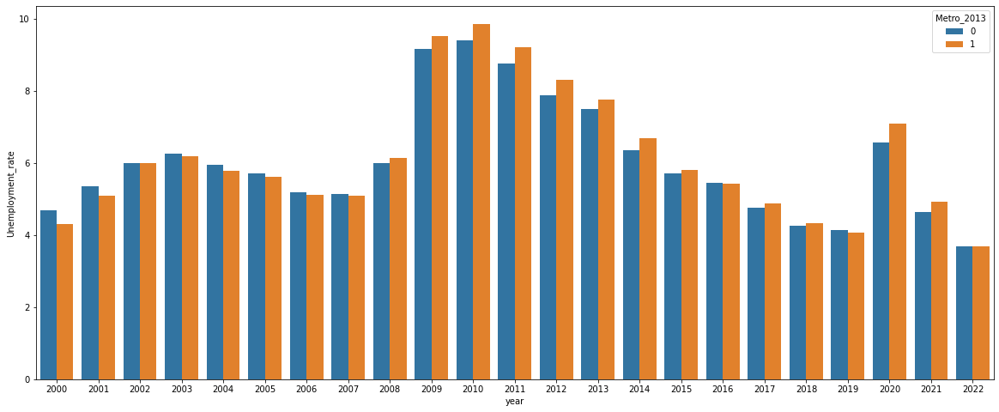

In [0]:
#Plot Unemployment Rate by year and by Metro type of community (metro/urban and non-metro/urban)
plt.figure(figsize=(20,8))
sns.barplot(x='year', y='Unemployment_rate', data=unemployment_metro, hue='Metro_2013')
plt.show()

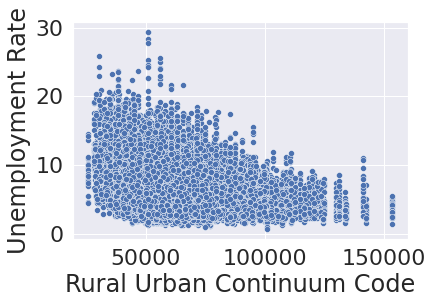

In [0]:
#Plot Median_Household_Income
plt.plot(figsize=(24, 6))
sns.set(rc={'figure.figsize':(20,8)})
from matplotlib import rcParams

# figure size in inches
rcParams['figure.figsize'] = 20,8

sns.set(font_scale=2)

sns.scatterplot(x='Median_Household_Income_2021', y='Unemployment_rate', data=melted, palette="crest")
plt.xlabel('Rural Urban Continuum Code')
plt.ylabel('Unemployment Rate')
plt.show()

In [0]:
unemployment_state=pd.DataFrame(melted.groupby('State')['Unemployment_rate'].mean().reset_index())

In [0]:
unemployment_statesorted = unemployment_state.sort_values(by=['Unemployment_rate'], ascending=False)

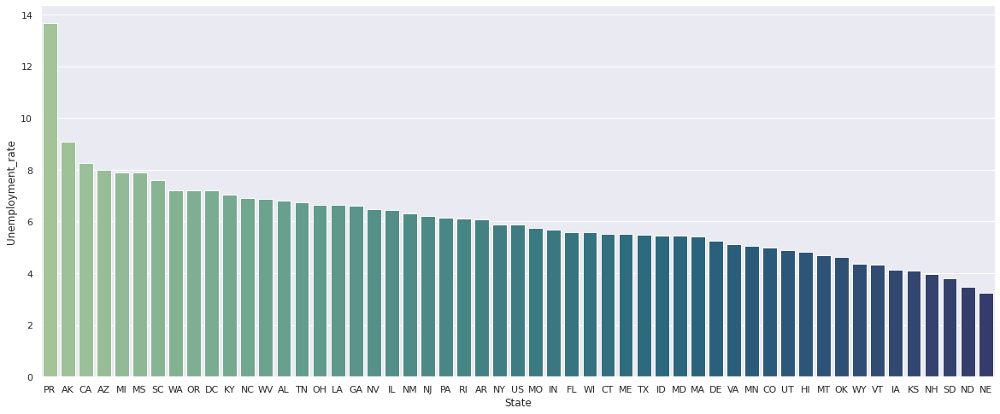

In [0]:
#Plot Mean Unemployment by State
plt.plot(figsize=(24, 6))
sns.set(rc={'figure.figsize':(20,8)})
from matplotlib import rcParams
sns.set(font_scale=1.2)

# figure size in inches
rcParams['figure.figsize'] = 20,8
sns.barplot(x='State', y='Unemployment_rate', data=unemployment_statesorted, palette="crest")
plt.show()

Prepare Data for Modeling

In [0]:
#Copy dataframe for subsequent data preparation for modeling
unemployment=melted.copy()

In [0]:
#Check Missing Values
unemployment.isnull().sum()

Out[30]: FIPS_Code                                       0
State                                           0
Area_Name                                       0
Rural_Urban_Continuum_Code_2013              1334
Urban_Influence_Code_2013                    1334
Metro_2013                                   1219
Civilian_labor_force_2000                     161
Median_Household_Income_2021                 1909
Med_HH_Income_Percent_of_State_Total_2021    1932
year                                            0
Unemployment_rate                             225
dtype: int64

In [0]:
unemployment=unemployment.dropna()
unemployment.isnull().sum()

Out[31]: FIPS_Code                                    0
State                                        0
Area_Name                                    0
Rural_Urban_Continuum_Code_2013              0
Urban_Influence_Code_2013                    0
Metro_2013                                   0
Civilian_labor_force_2000                    0
Median_Household_Income_2021                 0
Med_HH_Income_Percent_of_State_Total_2021    0
year                                         0
Unemployment_rate                            0
dtype: int64

In [0]:
#Check data types of each column
unemployment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72091 entries, 2 to 75291
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   FIPS_Code                                  72091 non-null  object 
 1   State                                      72091 non-null  object 
 2   Area_Name                                  72091 non-null  object 
 3   Rural_Urban_Continuum_Code_2013            72091 non-null  object 
 4   Urban_Influence_Code_2013                  72091 non-null  object 
 5   Metro_2013                                 72091 non-null  object 
 6   Civilian_labor_force_2000                  72091 non-null  object 
 7   Median_Household_Income_2021               72091 non-null  float64
 8   Med_HH_Income_Percent_of_State_Total_2021  72091 non-null  float64
 9   year                                       72091 non-null  int64  
 10  Unemployment_rate     

In [0]:
unemployment.head()

,FIPS_Code,State,Area_Name,Rural_Urban_Continuum_Code_2013,Urban_Influence_Code_2013,Metro_2013,Civilian_labor_force_2000,Median_Household_Income_2021,Med_HH_Income_Percent_of_State_Total_2021,year,Unemployment_rate
2,1001,AL,"Autauga County, AL",2,2,1,21861.00,66444.0,123.1,2000,4.1
3,1003,AL,"Baldwin County, AL",3,2,1,69979.00,65658.0,121.6,2000,3.7
4,1005,AL,"Barbour County, AL",6,6,0,11449.00,38649.0,71.6,2000,5.6
5,1007,AL,"Bibb County, AL",1,1,1,8623.00,48454.0,89.7,2000,5.4
6,1009,AL,"Blount County, AL",1,1,1,25266.00,56894.0,105.4,2000,3.5


In [0]:
unemployment['FIPS_Code']=unemployment['FIPS_Code'].astype(int)


In [0]:
unemployment['Rural_Urban_Continuum_Code_2013']=unemployment['Rural_Urban_Continuum_Code_2013'].astype('int')
unemployment['Urban_Influence_Code_2013']=unemployment['Urban_Influence_Code_2013'].astype(int)
unemployment['Metro_2013']=unemployment['Metro_2013'].astype(int)

unemployment['Median_Household_Income_2021']=unemployment['Median_Household_Income_2021'].astype(int)
unemployment['Med_HH_Income_Percent_of_State_Total_2021']=unemployment['Med_HH_Income_Percent_of_State_Total_2021'].astype(float)
unemployment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72091 entries, 2 to 75291
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   FIPS_Code                                  72091 non-null  int64  
 1   State                                      72091 non-null  object 
 2   Area_Name                                  72091 non-null  object 
 3   Rural_Urban_Continuum_Code_2013            72091 non-null  int64  
 4   Urban_Influence_Code_2013                  72091 non-null  int64  
 5   Metro_2013                                 72091 non-null  int64  
 6   Civilian_labor_force_2000                  72091 non-null  object 
 7   Median_Household_Income_2021               72091 non-null  int64  
 8   Med_HH_Income_Percent_of_State_Total_2021  72091 non-null  float64
 9   year                                       72091 non-null  int64  
 10  Unemployment_rate     

In [0]:
#unemployment['Civilian_labor_force_2000']=unemployment['Civilian_labor_force_2000'].astype(int)
unemployment['Civilian_labor_force_2000']=unemployment['Civilian_labor_force_2000'].astype(str).astype(float)

In [0]:
unemployment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72091 entries, 2 to 75291
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   FIPS_Code                                  72091 non-null  int64  
 1   State                                      72091 non-null  object 
 2   Area_Name                                  72091 non-null  object 
 3   Rural_Urban_Continuum_Code_2013            72091 non-null  int64  
 4   Urban_Influence_Code_2013                  72091 non-null  int64  
 5   Metro_2013                                 72091 non-null  int64  
 6   Civilian_labor_force_2000                  72091 non-null  float64
 7   Median_Household_Income_2021               72091 non-null  int64  
 8   Med_HH_Income_Percent_of_State_Total_2021  72091 non-null  float64
 9   year                                       72091 non-null  int64  
 10  Unemployment_rate     

In [0]:
unemployment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72091 entries, 2 to 75291
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   FIPS_Code                                  72091 non-null  int64  
 1   State                                      72091 non-null  object 
 2   Area_Name                                  72091 non-null  object 
 3   Rural_Urban_Continuum_Code_2013            72091 non-null  int64  
 4   Urban_Influence_Code_2013                  72091 non-null  int64  
 5   Metro_2013                                 72091 non-null  int64  
 6   Civilian_labor_force_2000                  72091 non-null  float64
 7   Median_Household_Income_2021               72091 non-null  int64  
 8   Med_HH_Income_Percent_of_State_Total_2021  72091 non-null  float64
 9   year                                       72091 non-null  int64  
 10  Unemployment_rate     

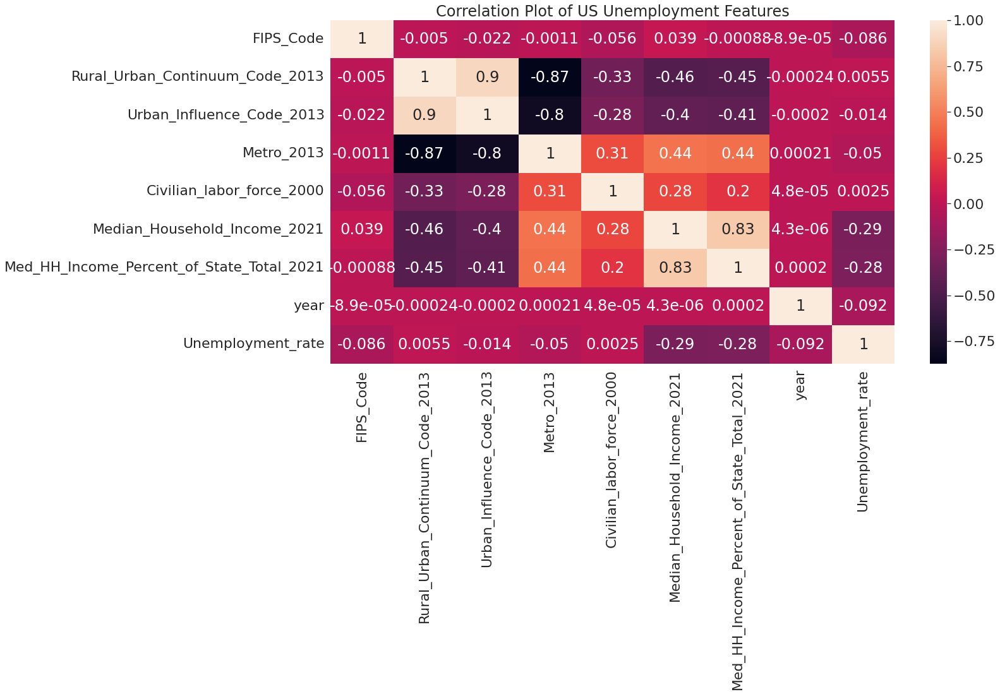

In [0]:
#Plot Correlation Heatmap of Unemployment Features
plt.figure(figsize=(20,10))
# plotting correlation heatmap
sns.set(font_scale=2)

dataplot = sns.heatmap(unemployment.corr(), annot=True).set(title='Correlation Plot of US Unemployment Features')

# displaying heatmap
plt.show();

In [0]:
#Convert pandas dataframe to pandas-on-Spark DataFrame to proceed with modelling with MLlib
from pyspark.sql import SparkSession

spark = SparkSession.builder.master("local").appName("app").getOrCreate()
unemployment_pyspark_df = spark.createDataFrame(unemployment)

In [0]:
#Define feature columns (omit the index and target label column)
nonFeatureCols = ["Unemployment_rate"]
featureCols = ['FIPS_Code', 'Rural_Urban_Continuum_Code_2013', 'Urban_Influence_Code_2013', 'Metro_2013', 'Civilian_labor_force_2000', 'Median_Household_Income_2021', 'Med_HH_Income_Percent_of_State_Total_2021', 'year']

In [0]:
from pyspark.ml.feature import VectorAssembler
 
assembler = (VectorAssembler()
  .setInputCols(featureCols)
  .setOutputCol("features"))
 
finalunemployment = assembler.transform(unemployment_pyspark_df)

In [0]:
#Split data into train and test
training, test = finalunemployment.randomSplit([0.7, 0.3])
 
#  Cache the data 
training.cache()
test.cache()
 
print(training.count())
print(test.count())

50640
21451


In [0]:
#Random Forest Regression model with hyperparameter tuning
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import RegressionEvaluator
 
from pyspark.ml import Pipeline
 
rfModel = (RandomForestRegressor()
  .setLabelCol("Unemployment_rate")
  .setFeaturesCol("features"))
 
paramGrid = (ParamGridBuilder()
  .addGrid(rfModel.maxDepth, [5,10])
  .addGrid(rfModel.numTrees, [20,60])
  .build())

 
stages = [rfModel]
 
pipeline = Pipeline().setStages(stages)
 
cv = (CrossValidator() 
  .setEstimator(pipeline) 
  .setEstimatorParamMaps(paramGrid)
  .setEvaluator(RegressionEvaluator().setLabelCol("Unemployment_rate")))
 
pipelineFitted = cv.fit(training)

In [0]:
#Identify the best model from hyperparamter tuning - best model has 60 trees and 9 features, we passed 10 features, so most features are significant in predicting the diamond price, we can check the feature importance of this model as well (further below)
print("The Best Parameters:\n--------------------")
print(pipelineFitted.bestModel.stages[0])
pipelineFitted.bestModel.stages[0].extractParamMap()

The Best Parameters:
--------------------
RandomForestRegressionModel: uid=RandomForestRegressor_a069a0666c75, numTrees=60, numFeatures=8
Out[44]: {Param(parent='RandomForestRegressor_a069a0666c75', name='bootstrap', doc='Whether bootstrap samples are used when building trees.'): True,
 Param(parent='RandomForestRegressor_a069a0666c75', name='cacheNodeIds', doc='If false, the algorithm will pass trees to executors to match instances with nodes. If true, the algorithm will cache node IDs for each instance. Caching can speed up training of deeper trees. Users can set how often should the cache be checkpointed or disable it by setting checkpointInterval.'): False,
 Param(parent='RandomForestRegressor_a069a0666c75', name='checkpointInterval', doc='set checkpoint interval (>= 1) or disable checkpoint (-1). E.g. 10 means that the cache will get checkpointed every 10 iterations. Note: this setting will be ignored if the checkpoint directory is not set in the SparkContext.'): 10,
 Param(parent

In [0]:
pipelineFitted.bestModel

Out[45]: PipelineModel_4b6abf4fc803

In [0]:
#Make predictions from the test dataset using the best model
holdout2 = pipelineFitted.bestModel.transform(test)

In [0]:
display(holdout2)

FIPS_Code,State,Area_Name,Rural_Urban_Continuum_Code_2013,Urban_Influence_Code_2013,Metro_2013,Civilian_labor_force_2000,Median_Household_Income_2021,Med_HH_Income_Percent_of_State_Total_2021,year,Unemployment_rate,features,prediction
1001,AL,"Autauga County, AL",2,2,1,21861.0,66444,123.1,2001,4.1,"Map(vectorType -> dense, length -> 8, values -> List(1001.0, 2.0, 2.0, 1.0, 21861.0, 66444.0, 123.1, 2001.0))",4.474889727296892
1007,AL,"Bibb County, AL",1,1,1,8623.0,48454,89.7,2000,5.4,"Map(vectorType -> dense, length -> 8, values -> List(1007.0, 1.0, 1.0, 1.0, 8623.0, 48454.0, 89.7, 2000.0))",5.142191481410693
1017,AL,"Chambers County, AL",6,5,0,17486.0,45447,84.2,2002,6.7,"Map(vectorType -> dense, length -> 8, values -> List(1017.0, 6.0, 5.0, 0.0, 17486.0, 45447.0, 84.2, 2002.0))",6.433090642377922
1019,AL,"Cherokee County, AL",6,6,0,11378.0,46365,85.9,2001,4.6,"Map(vectorType -> dense, length -> 8, values -> List(1019.0, 6.0, 6.0, 0.0, 11378.0, 46365.0, 85.9, 2001.0))",5.999275102153549
1023,AL,"Choctaw County, AL",9,10,0,6226.0,40601,75.2,2001,7.2,"Map(vectorType -> dense, length -> 8, values -> List(1023.0, 9.0, 10.0, 0.0, 6226.0, 40601.0, 75.2, 2001.0))",7.058118551955658
1025,AL,"Clarke County, AL",7,11,0,11677.0,45447,84.2,2002,9.1,"Map(vectorType -> dense, length -> 8, values -> List(1025.0, 7.0, 11.0, 0.0, 11677.0, 45447.0, 84.2, 2002.0))",6.800609634771417
1027,AL,"Clay County, AL",9,10,0,6608.0,47036,87.1,2002,6.2,"Map(vectorType -> dense, length -> 8, values -> List(1027.0, 9.0, 10.0, 0.0, 6608.0, 47036.0, 87.1, 2002.0))",6.548436162916355
1029,AL,"Cleburne County, AL",8,4,0,7002.0,49769,92.2,2000,4.1,"Map(vectorType -> dense, length -> 8, values -> List(1029.0, 8.0, 4.0, 0.0, 7002.0, 49769.0, 92.2, 2000.0))",5.39342039795463
1031,AL,"Coffee County, AL",4,5,0,20037.0,55052,102.0,2000,5.9,"Map(vectorType -> dense, length -> 8, values -> List(1031.0, 4.0, 5.0, 0.0, 20037.0, 55052.0, 102.0, 2000.0))",4.627651771979688
1033,AL,"Colbert County, AL",3,2,1,26124.0,53341,98.8,2001,6.9,"Map(vectorType -> dense, length -> 8, values -> List(1033.0, 3.0, 2.0, 1.0, 26124.0, 53341.0, 98.8, 2001.0))",5.22769721650891


In [0]:
predictions_pdf = holdout2.select("*").toPandas()

/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field features. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


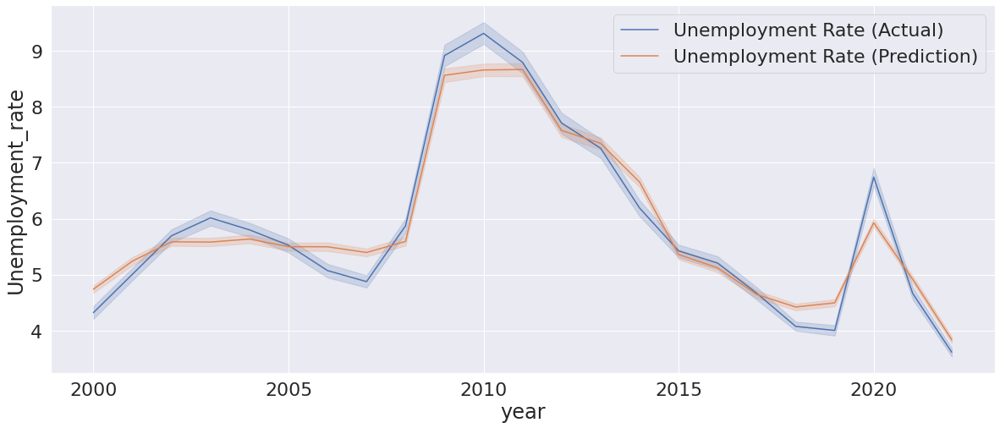

In [0]:
#Plot Mean Unemployment Rate and Model Prediction in USA by Year
plt.figure(figsize=(20, 8))
#f, ax = plt.subplots(1, 1)
sns.set(font_scale=2)

sns.lineplot(x='year', y='Unemployment_rate', data=predictions_pdf, label='Unemployment Rate (Actual)')
sns.lineplot(x='year', y='prediction', data=predictions_pdf, label='Unemployment Rate (Prediction)')
plt.legend()
plt.show()

The Unemployment Rate prediction using the Random Forest Regression with Spark MLlib provides a good overall prediction of the trends over time (2000-2020) with MAE = 1.09 and R2=0.68. 

The discrepancies in the predictions are mainly due to peaks and valleys in unemployment when there are significant increases/decreases in unemployment that are different from the overall trends. 

These changes in unemployment happen due to economic events that are not easily predictable (ex. market crashes around 2000, 2008).

In [0]:
#Evaluate model performance using RegressionMetrics
from pyspark.mllib.evaluation import RegressionMetrics
 
rm2 = RegressionMetrics(holdout2.select("prediction", "Unemployment_rate").rdd.map(lambda x:  (float(x[0]), float(x[1]))))
print("MSE: ", rm2.meanSquaredError)
print("MAE: ", rm2.meanAbsoluteError)
print("RMSE Squared: ", rm2.rootMeanSquaredError)
print("R Squared: ", rm2.r2)
print("Explained Variance: ", rm2.explainedVariance, "\n")

/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


MSE:  2.1586930022552004
MAE:  1.0793101810635228
RMSE Squared:  1.4692491287236487
R Squared:  0.686351070593187
Explained Variance:  3.5237146954741254 



In [0]:
#Feature Importances
featureImportance = pipelineFitted.bestModel.stages[0].featureImportances.toArray()
featureNames = map(lambda s: s.name, finalunemployment.schema.fields)
featureImportanceMap = zip(featureImportance, featureNames)

In [0]:
importancesDf = spark.createDataFrame(sc.parallelize(featureImportanceMap).map(lambda r: [r[1], float(r[0])]))

In [0]:
importancesDf = importancesDf.withColumnRenamed("_1", "Feature").withColumnRenamed("_2", "Importance")

In [0]:
#display(importancesDf)
importancesDf.orderBy("Importance").show(truncate=False)

+-------------------------------+---------------------+
|Feature                        |Importance           |
+-------------------------------+---------------------+
|Rural_Urban_Continuum_Code_2013|0.0022027793643472912|
|State                          |0.022023215228360808 |
|Area_Name                      |0.032707491445827463 |
|Urban_Influence_Code_2013      |0.07250095485803351  |
|FIPS_Code                      |0.09417666797955304  |
|Civilian_labor_force_2000      |0.10357882399291701  |
|Metro_2013                     |0.17045384456334572  |
|Median_Household_Income_2021   |0.5023562225676153   |
+-------------------------------+---------------------+



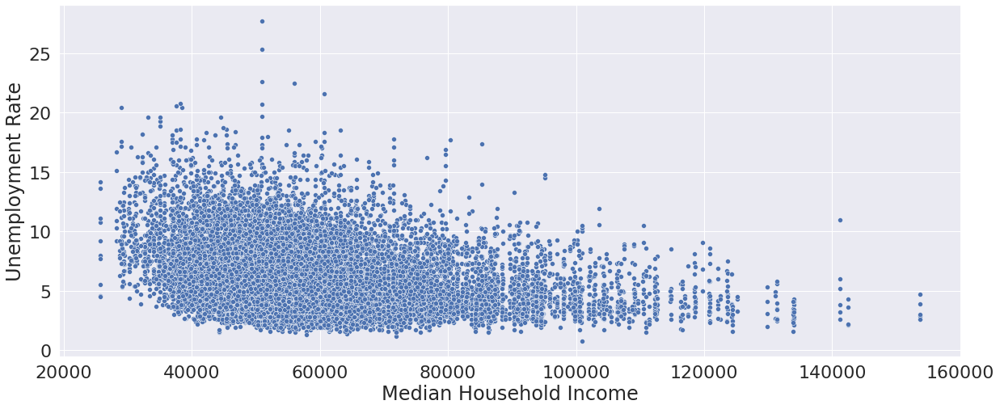

In [0]:
#Plot Mean Unemployment Rate in USA by Year
plt.figure(figsize=(20, 8))
sns.set(font_scale=2)

sns.scatterplot(x='Median_Household_Income_2021', y='Unemployment_rate', data=predictions_pdf)
plt.xlabel('Median Household Income')
plt.ylabel('Unemployment Rate')
plt.show()

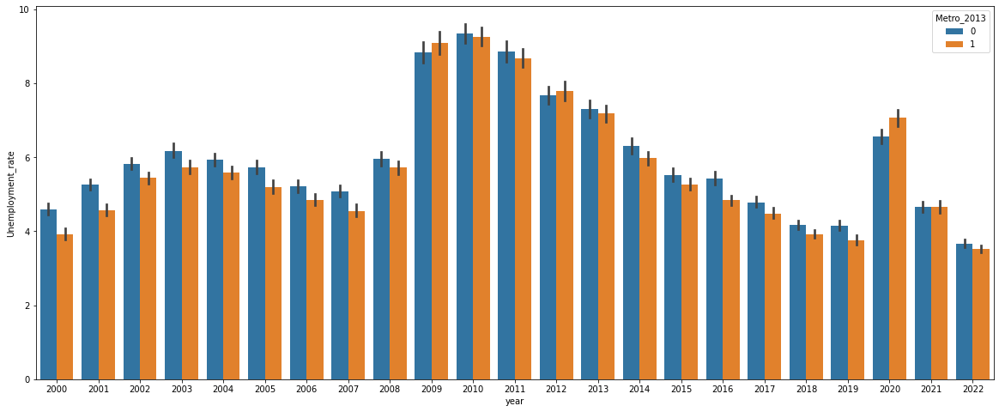

In [0]:
#Plot Mean Unemployment Rate in USA by Year
plt.figure(figsize=(20, 8))

sns.barplot(x='year', y='Unemployment_rate', data=predictions_pdf, hue='Metro_2013')
plt.show()